In [1]:
import seaborn as sns
from rich import print, inspect, traceback, pretty

from chaotic_carbon_networks.preprocessing import concat_airs_data, concat_graced_data
from chaotic_carbon_networks.utils import plot_world, mask_poles
from chaotic_carbon_networks.anomaly_correction import anomaly_correction_month, anomaly_correction_week
from chaotic_carbon_networks.hex import hexgrid
from chaotic_carbon_networks.full_analysis import analyse_single_dataset
from chaotic_carbon_networks.population_masking import mask_population

sns.set_theme(context='paper', style="whitegrid", palette="Set2", font_scale=1.5, rc={'figure.figsize':(9,6)})
pretty.install()
traceback.install()

<bound method InteractiveShell.excepthook of <ipykernel.zmqshell.ZMQInteractiveShell object at 0x7f8ee3c4e250>>

## AIRS CO2

Loading cached data from /home/tobias/Repositories/chaotic-carbon-networks/data/aqua-airs/cache/aqua_airs_concat.nc

<xarray.DataArray 'co2_vmr_uppertrop' (time: 255, vertex: 5882)> Size: 6MB
array([[-1.9319123e-05, -1.9346917e-05, -1.9231928e-05, ...,
        -2.0059932e-05, -1.9748637e-05, -2.0568230e-05],
       [-2.0008942e-05, -2.0674575e-05, -1.9895902e-05, ...,
        -1.9052735e-05, -1.9100524e-05, -1.9049214e-05],
       [-1.9991276e-05, -2.0384032e-05, -2.0353356e-05, ...,
        -1.8671359e-05, -1.9230240e-05, -1.8537219e-05],
       ...,
       [ 1.9564322e-05,  1.9096100e-05,  2.0118110e-05, ...,
         2.0730455e-05,  2.0638923e-05,  2.0097563e-05],
       [ 2.0145730e-05,  2.0173000e-05,  1.9849802e-05, ...,
         1.9620726e-05,  1.9517145e-05,  1.9003171e-05],
       [ 2.0793581e-05,  2.0740292e-05,  2.0113424e-05, ...,
         2.0458829e-05,  2.0568201e-05,  1.9764178e-05]], dtype=float32)
Coordinates:
  * time        (time) datetime64[ns] 2kB 2002-09-01 2002-10-01 ... 2023-11-01
    orbit_pass  (time) timedelta64[ns] 2kB 13:30:00 13:30:00 ... 13:30:00
  * vertex      (vertex) int64 47kB 585468501313978367 ... 589755497150676991
    month       (time) int64 2kB 9 10 11 12 1 2 3 4 5 6 ... 3 4 5 6 7 8 9 10 11
Attributes:
    units:                  m3 / m3
    ancillary_variables:    co2_vmr_uppertrop_nobs co2_vmr_uppertrop_sdev
    long_name:              CO2 upper troposphere VMR Anomaly
    description:            Carbon Monoxide volume mixing ratio to dry air be...
    cell_methods:           area: mean
    coverage_content_type:  physicalMeasurement
    hex_res:                2

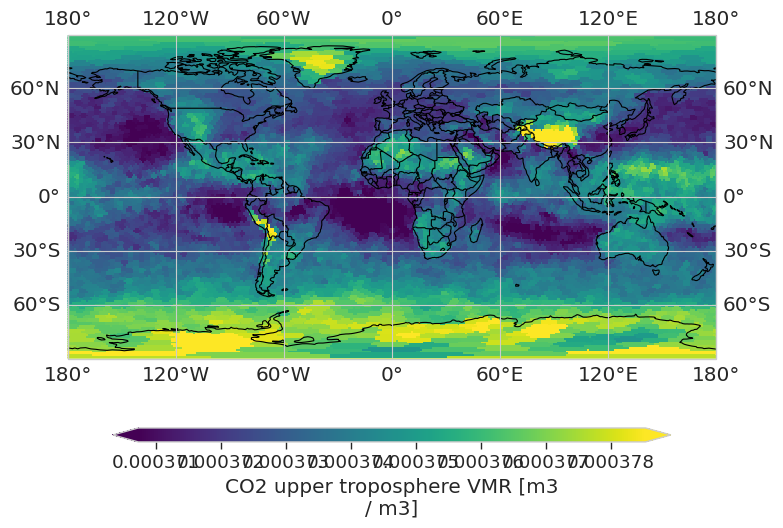

In [2]:
co2 = concat_airs_data()["co2_vmr_uppertrop"].sel(orbit_pass="13:30:00")

# Mask very upper degrees because data gets noise there
# co2 = mask_poles(co2, 85)

# Convert to hexgrid
co2 = hexgrid(co2, method="mean", hex_res=2)

plot_world(co2.isel(time=0))
co2 = anomaly_correction_month(co2)
co2

Using a threshold of 0.998547139143286 for the adjacency matrix

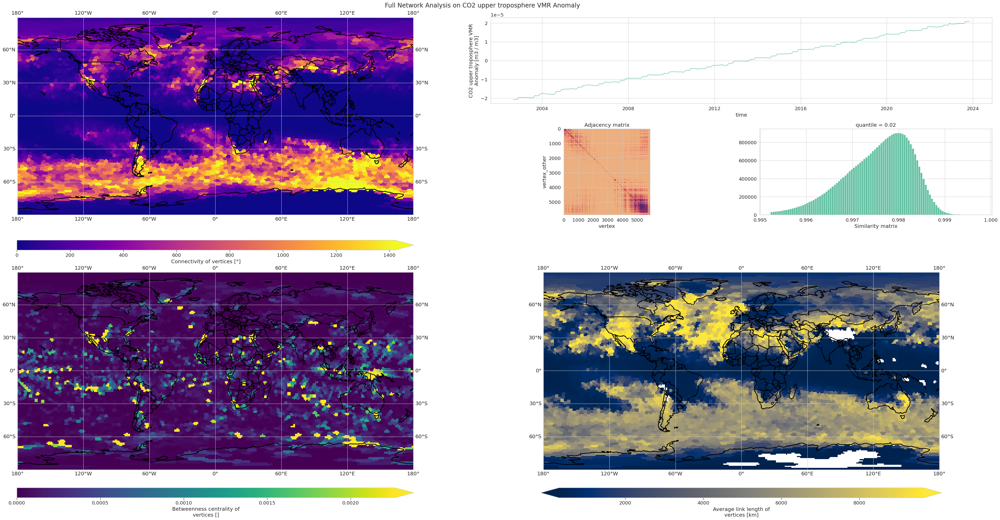

In [3]:
analyse_single_dataset(co2, "similarity", "airs-co2-similarity-hex-month");

Calculating similarity matrix for lags from 6 to 25

Output()

Using a threshold of 2070.825962934995 for the adjacency matrix

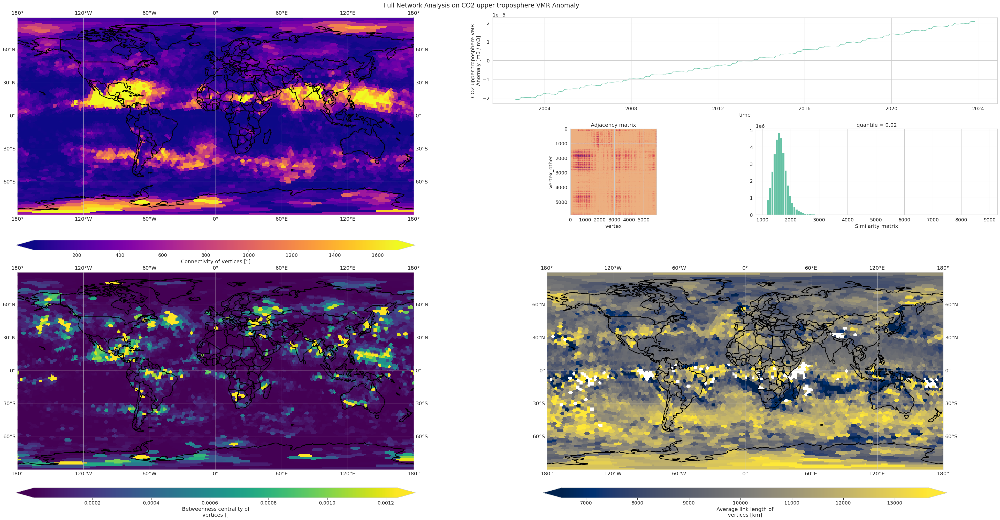

In [4]:
analyse_single_dataset(co2, "lagged_similarity", "airs-co2-lagged-similarity-hex-month");

Using a threshold of 2.624239444732666 for the adjacency matrix

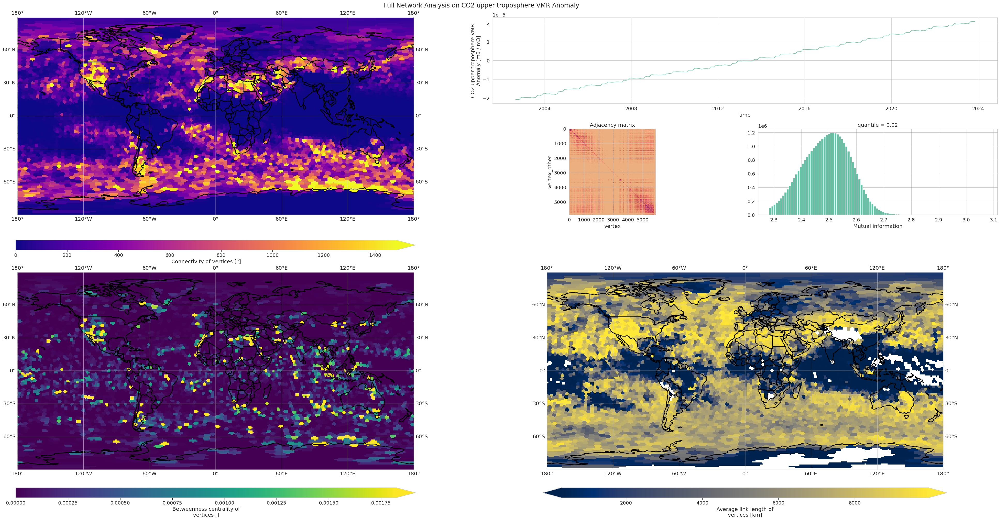

In [5]:
analyse_single_dataset(co2, "mutual_information", "airs-co2-mi-hex-month");

## AIRS Methane

Loading cached data from /home/tobias/Repositories/chaotic-carbon-networks/data/aqua-airs/cache/aqua_airs_concat.nc

<xarray.DataArray 'ch4_mmr_midtrop' (time: 255, vertex: 5882)> Size: 6MB
array([[-2.7128635e-08, -2.5589884e-08, -2.5294526e-08, ...,
        -1.5568617e-08, -1.1155407e-08, -1.6430249e-08],
       [-3.3544211e-08, -3.0248543e-08, -2.9556304e-08, ...,
        -4.5622073e-08, -4.5223260e-08, -4.0160103e-08],
       [-3.2695198e-08, -3.0642127e-08, -3.7014047e-08, ...,
        -6.3315269e-08, -6.9546729e-08, -5.8930027e-08],
       ...,
       [ 2.7411488e-08,  2.1621872e-08,  3.4329673e-08, ...,
         4.6332957e-08,  4.7008143e-08,  3.9942961e-08],
       [ 4.4586500e-08,  4.1907583e-08,  4.1713747e-08, ...,
         4.9756522e-08,  5.3105509e-08,  4.5122988e-08],
       [ 4.6088871e-08,  4.6703008e-08,  4.5419256e-08, ...,
         6.4882670e-08,  6.6820689e-08,  5.3350846e-08]], dtype=float32)
Coordinates:
  * time        (time) datetime64[ns] 2kB 2002-09-01 2002-10-01 ... 2023-11-01
    orbit_pass  (time) timedelta64[ns] 2kB 13:30:00 13:30:00 ... 13:30:00
  * vertex      (vertex) int64 47kB 585468501313978367 ... 589755497150676991
    month       (time) int64 2kB 9 10 11 12 1 2 3 4 5 6 ... 3 4 5 6 7 8 9 10 11
Attributes:
    units:                  kg / kg
    ancillary_variables:    ch4_mmr_midtrop_nobs ch4_mmr_midtrop_sdev
    long_name:              CH4 midtroposphere MMR to dry air Anomaly
    standard_name:          mass_fraction_of_methane_in_air
    description:            Methane mass mixing ratio to dry air at 40000 Pa,...
    cell_methods:           area: mean
    coverage_content_type:  physicalMeasurement
    hex_res:                2

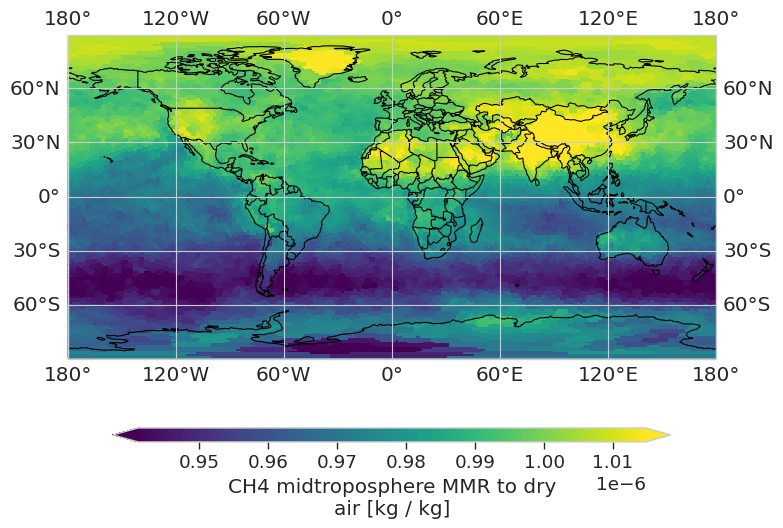

In [6]:
del co2

ch4 = concat_airs_data()["ch4_mmr_midtrop"].sel(orbit_pass="13:30:00")

# Convert to hexgrid
ch4 = hexgrid(ch4, method="mean", hex_res=2)

plot_world(ch4.isel(time=0))
ch4 = anomaly_correction_month(ch4)
ch4

Using a threshold of 0.9666073575460392 for the adjacency matrix

Calculating similarity matrix for lags from 6 to 25

Output()

Using a threshold of 171.65248549321825 for the adjacency matrix

Using a threshold of 1.4420089721679688 for the adjacency matrix

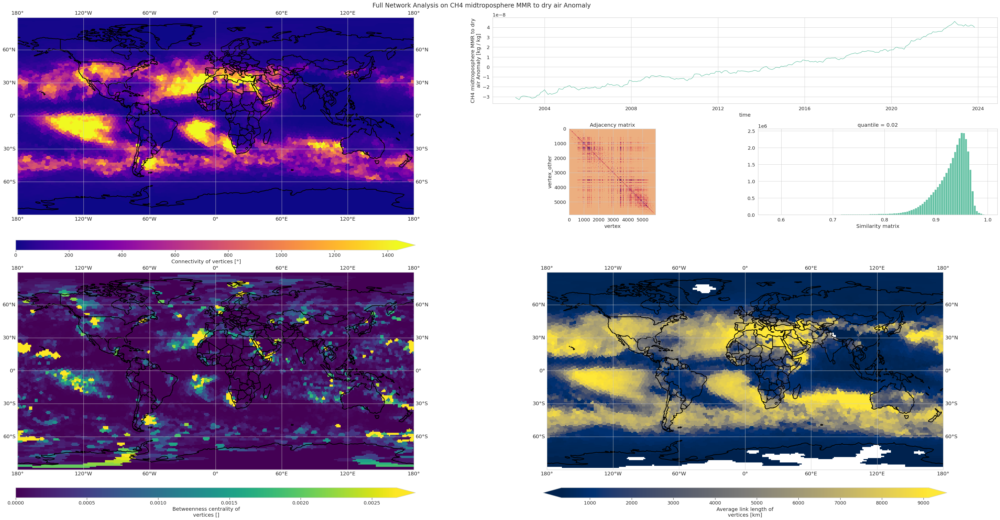

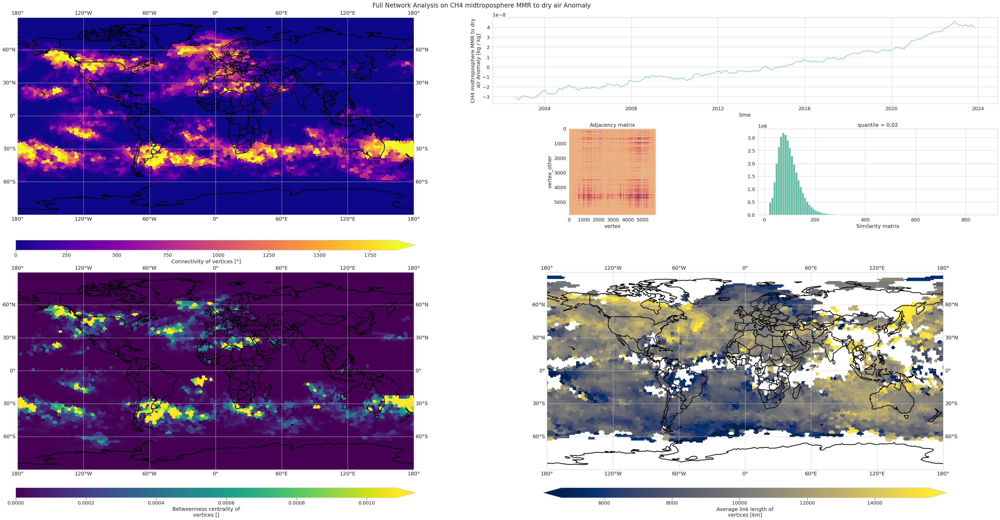

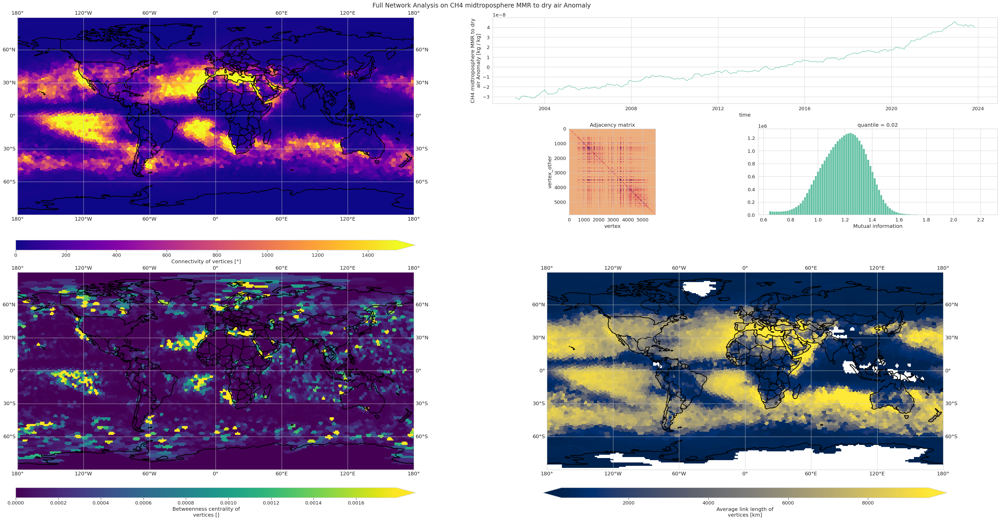

In [7]:
analyse_single_dataset(ch4, "similarity", "airs-ch4-similarity-hex-month");
analyse_single_dataset(ch4, "lagged_similarity", "airs-ch4-lagged-similarity-hex-month");
analyse_single_dataset(ch4, "mutual_information", "airs-ch4-mi-hex-month");

## Graced

Loading cached data from 
/home/tobias/Repositories/chaotic-carbon-networks/data/graced/cache/graced_co2_concat_5x_sumed.nc

Loading cached population data from 
/home/tobias/Repositories/chaotic-carbon-networks/data/population/cache/GHS_POP_E2020_GLOBE_R2023A_4326_30ss_V1_0_r
esampled_0.50deg.nc

<xarray.DataArray 'graced_co2_concat_5x_sumed' (time: 225, vertex: 5047)> Size: 5MB
array([[   -9480.375,    27394.25 ,  -699142.   , ..., -1277065.   ,
         -201802.   ,   -52567.375],
       [   81478.375,   115058.25 ,   767964.   , ...,  -136429.   ,
          -42967.   ,   -11573.75 ],
       [   79992.875,   106039.   ,  1043162.   , ...,   391866.   ,
           27078.5  ,    11263.625],
       ...,
       [  211999.   ,   274866.62 ,   547464.   , ...,   362338.   ,
          102292.25 ,   -17139.125],
       [  264583.62 ,   325648.75 ,  1447062.   , ...,   534382.   ,
          145205.25 ,    32805.25 ],
       [  251976.38 ,   313467.62 ,  1569292.   , ...,  1090966.   ,
          152093.62 ,    36883.625]], dtype=float32)
Coordinates:
  * time         (time) datetime64[ns] 2kB 2019-01-04 2019-01-11 ... 2023-06-21
    band         (time) int64 2kB 1 1 1 1 1 1 1 1 1 1 1 ... 1 1 1 1 1 1 1 1 1 1
    spatial_ref  (time) int64 2kB 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
  * vertex       (vertex) int64 40kB 590121153486389247 ... 593901961657450495
    month        (time) int64 2kB 1 1 1 1 2 2 2 2 3 3 3 ... 4 4 5 5 5 5 5 6 6 6
Attributes:
    units:      kgC
    long_name:  Carbon Dioxide Emissions Anomaly
    hex_res:    3

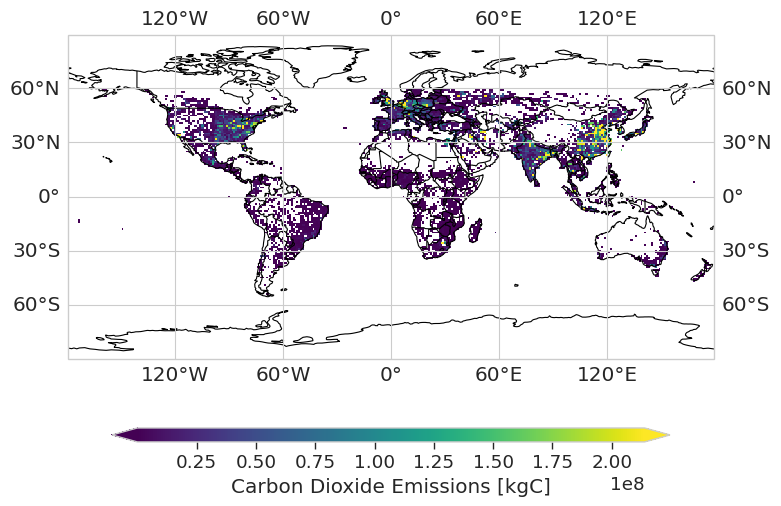

In [8]:
#del ch4

co2 = concat_graced_data(5, method="sum")

# Further reduce data load
co2 = co2.coarsen(time=7, boundary="trim").sum()

# Masking
co2 = mask_population(co2, threshold=0)
co2 = mask_poles(co2)

co2 = hexgrid(co2, method="sum", hex_res=3)

plot_world(co2.isel(time=0))

# Anomaly Correction
co2 = anomaly_correction_month(co2)

co2

Using a threshold of 0.9592138169300094 for the adjacency matrix

Calculating similarity matrix for lags from 5 to 22

Output()

Using a threshold of 8.722913303493515 for the adjacency matrix

Using a threshold of 2.2649765014648438e-06 for the adjacency matrix

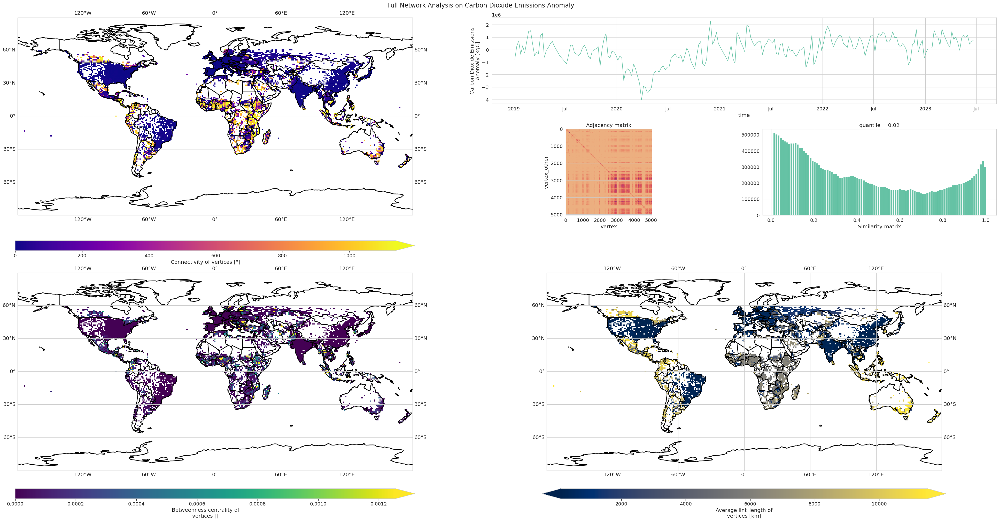

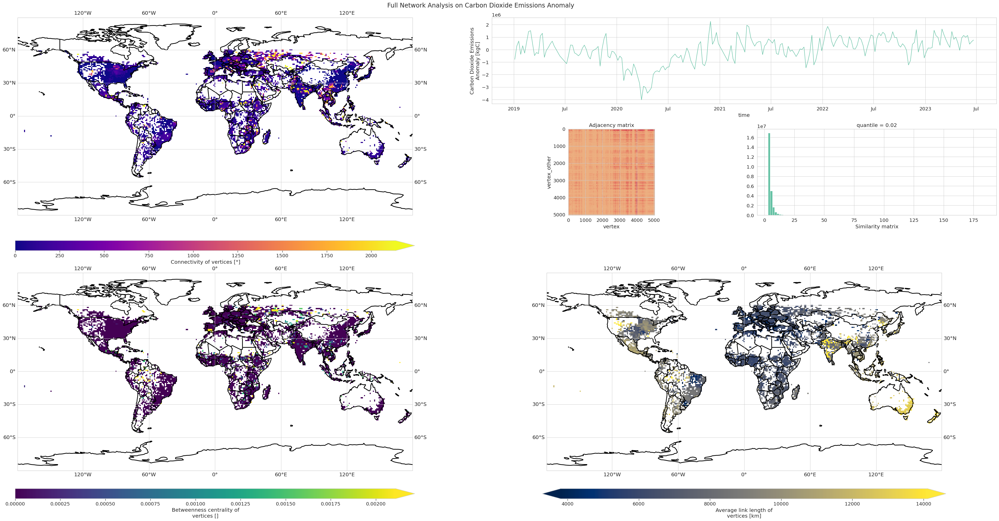

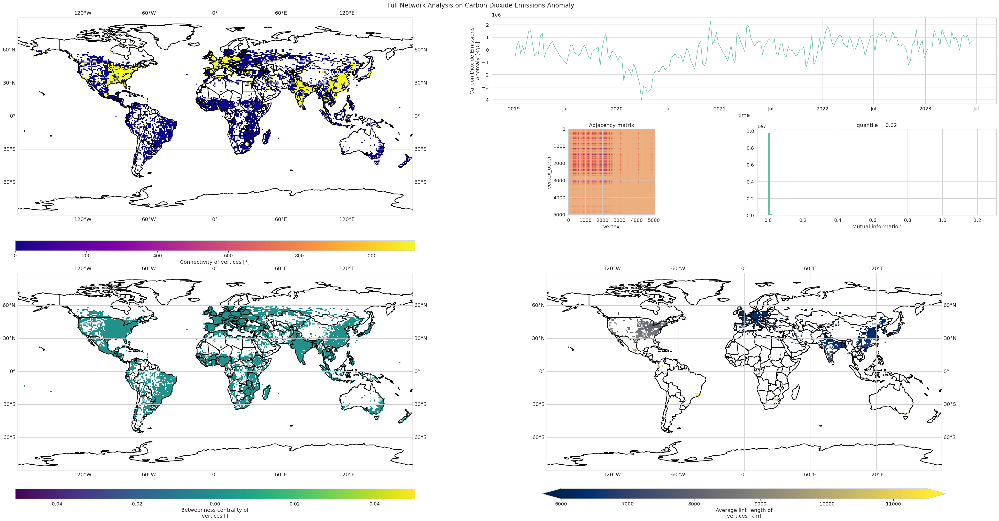

In [9]:
analyse_single_dataset(co2, "similarity", "graced-similarity-hex-month");
analyse_single_dataset(co2, "lagged_similarity", "graced-lagged-similarity-hex-month");
analyse_single_dataset(co2, "mutual_information", "graced-mi-hex-month");